# Baseline model for batch monitoring example

In [1]:
import requests
import datetime
import pandas as pd
import matplotlib.pyplot as plt

from evidently import ColumnMapping
from evidently.report import Report
from evidently.metrics import (
    ColumnDriftMetric, 
    DatasetDriftMetric,
    DatasetMissingValuesMetric
)

from joblib import load, dump
from tqdm import tqdm

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

**Download data and saving them for the artifacts folder `data`** 

In [2]:
files = [('green_tripdata_2022-02.parquet', './data'), ('green_tripdata_2022-01.parquet', './data')]

print("Download files:")
for file, path in files:
    url = f"https://d37ci6vzurychx.cloudfront.net/trip-data/{file}"
    resp = requests.get(url, stream=True)
    save_path = f"{path}/{file}"
    with open(save_path, "wb") as handle:
        for data in tqdm(resp.iter_content(),
                        desc=f"{file}",
                        postfix=f"save to {save_path}",
                        total=int(resp.headers["Content-Length"])):
            handle.write(data)

Download files:


green_tripdata_2022-01.parquet: 100%|██████████| 1254291/1254291 [00:19<00:00, 64680.39it/s, save to ./data/green_tripdata_2022-01.parquet]


In [3]:
jan_data = pd.read_parquet("data/green_tripdata_2022-01.parquet")

Getting insights into the data:

In [4]:
jan_data.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
count,62495.000000,62495,62495,56200.000000,62495.000000,62495.000000,56200.000000,62495.000000,62495.000000,62495.00000,62495.000000,62495.000000,62495.000000,62495.000000,62495.000000,56200.000000,56200.000000,56200.000000
mean,1.849508,2022-01-16 14:18:36.026354,2022-01-16 14:37:37.189551,1.198719,97.615041,135.969902,1.258399,77.758632,13.914000,0.34756,0.426322,1.666540,0.208182,0.297312,17.490532,1.403594,1.040925,0.706628
min,1.000000,2009-01-01 00:34:01,2009-01-01 17:05:20,1.000000,1.000000,1.000000,0.000000,0.000000,-65.000000,-4.50000,-0.500000,-0.860000,-6.550000,-0.300000,-71.850000,1.000000,1.000000,0.000000
25%,2.000000,2022-01-08 23:41:50,2022-01-08 23:55:28.500000,1.000000,55.000000,74.000000,1.000000,1.080000,7.000000,0.00000,0.500000,0.000000,0.000000,0.300000,9.360000,1.000000,1.000000,0.000000
50%,2.000000,2022-01-16 15:59:42,2022-01-16 16:17:00,1.000000,75.000000,137.000000,1.000000,1.900000,10.500000,0.00000,0.500000,1.000000,0.000000,0.300000,13.860000,1.000000,1.000000,0.000000
75%,2.000000,2022-01-24 09:16:50,2022-01-24 09:37:28,1.000000,130.000000,215.000000,1.000000,3.500000,17.000000,0.50000,0.500000,2.610000,0.000000,0.300000,21.050000,2.000000,1.000000,2.750000
max,2.000000,2022-01-31 23:57:37,2022-02-01 21:01:54,5.000000,265.000000,265.000000,8.000000,224481.380000,604.500000,4.50000,0.500000,76.770000,44.750000,0.300000,605.300000,5.000000,2.000000,2.750000
std,0.357556,NaN,NaN,0.862313,62.987311,77.590956,0.877743,2909.354163,12.088819,0.65781,0.181381,2.484928,1.257659,0.037201,13.623416,0.516316,0.198119,1.201632


In [5]:
jan_data.shape

(62495, 20)

In [6]:
# create target (trip duration in minutes)
jan_data["duration_min"] = jan_data["lpep_dropoff_datetime"] - jan_data["lpep_pickup_datetime"]
jan_data["duration_min"] = jan_data["duration_min"].apply(lambda td: float(td.total_seconds()) / 60)

In [7]:
# Filter out outliers
jan_data = jan_data[(jan_data["duration_min"] >= 0) & (jan_data["duration_min"] <= 60)]
jan_data = jan_data[(jan_data["passenger_count"] > 0) & (jan_data["passenger_count"] <= 8)]

<Axes: >

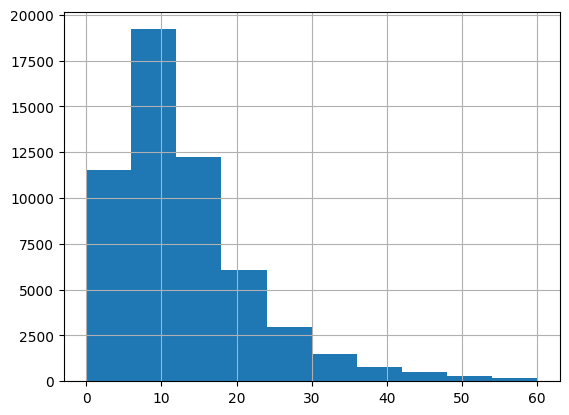

In [8]:
jan_data.duration_min.hist()

# Selecting features and training a linear regression model

Choosing an adequate subset of features to train the model with:

In [9]:
# Data labeling
target = "duration_min"
num_features = ["passenger_count", "trip_distance", "fare_amount", "total_amount"]
cat_features = ["PULocationID", "DOLocationID"]
features = num_features + cat_features

In [10]:
N = jan_data.shape[0]
print("Number of rows: ", N)

Number of rows:  55211


In [11]:
M: int = 30_000
train_data = jan_data[:M]
val_data = jan_data[M:]

X_train, y_train = train_data[features], train_data[target]
X_val, y_val = val_data[features], val_data[target]

print(f"Train data is {(len(train_data)/N * 100.0):.1f}% of the overall data")
print(f"Validation data is {(len(val_data)/N * 100.0):.1f}% of the overall data")

Train data is 54.3% of the overall data
Validation data is 45.7% of the overall data


In [12]:
model = LinearRegression()

In [13]:
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [14]:
train_preds = model.predict(X_train)
train_data["prediction"] = train_preds.copy()

In [15]:
val_preds = model.predict(X_val)
val_data["prediction"] = val_preds.copy()

In [16]:
mae_train = mean_absolute_error(train_data["duration_min"], train_data["prediction"])
mae_val = mean_absolute_error(val_data["duration_min"], val_data["prediction"])

print(f"MAE(train): {mae_train:.2f} min")
print(f"MAE(val): {mae_val:.2f} min")

MAE(train): 3.80 min
MAE(val): 4.14 min


# Dump model and reference data

In [17]:
# Dumping (saving) the model and validation dataset (reference data)
with open("models/lin_reg.bin", "wb") as f_out:
    dump(model, f_out)

val_data.to_parquet("data/reference.parquet")

# Evidently Report

In [18]:
column_mapping = ColumnMapping(
    target=None, 
    prediction="prediction",
    numerical_features=num_features,
    categorical_features=cat_features
)

In [19]:
report = Report(
    metrics=[
        ColumnDriftMetric(column_name="prediction"),
        DatasetDriftMetric(),
        DatasetMissingValuesMetric()
    ]
)

In [20]:
report.run(
    reference_data=train_data,
    current_data=val_data, 
    column_mapping=column_mapping
)

In [21]:
report.show(mode="inline")

HTML-Version of the results is used for visualization purposes. To programmatically process data however, python dictionaries are better suited and will be used.

In [21]:
result = report.as_dict()

In [22]:
result

{'metrics': [{'metric': 'ColumnDriftMetric',
   'result': {'column_name': 'prediction',
    'column_type': 'num',
    'stattest_name': 'Wasserstein distance (normed)',
    'stattest_threshold': 0.1,
    'drift_score': np.float64(0.03049316466166379),
    'drift_detected': False,
    'current': {'small_distribution': {'x': [-36.736366694183836,
       -15.174383681788175,
       6.387599330607486,
       27.94958234300315,
       49.51156535539881,
       71.07354836779447,
       92.63553138019014,
       114.19751439258579,
       135.75949740498146,
       157.32148041737713,
       178.88346342977277],
      'y': [9.197953980856957e-06,
       0.001109273250091349,
       0.044107868519801446,
       0.0010780002065564355,
       4.598976990428477e-05,
       1.6556317165542512e-05,
       1.8395907961713929e-06,
       3.6791815923427807e-06,
       1.8395907961713903e-06,
       3.6791815923427858e-06]}},
    'reference': {'small_distribution': {'x': [-28.669071967171682,
       -

Deriving any value from an evidently report:

In [23]:
# Results, check em!
print("Metric entries in results:")
for i in range(len(result["metrics"])):
    print(i, result["metrics"][i]["metric"])
print("\n", result["metrics"][0].keys())
print(result["metrics"][0]["metric"])
print(result["metrics"][0]["result"].keys())

Metric entries in results:
0 ColumnDriftMetric
1 DatasetDriftMetric
2 DatasetMissingValuesMetric

 dict_keys(['metric', 'result'])
ColumnDriftMetric
dict_keys(['column_name', 'column_type', 'stattest_name', 'stattest_threshold', 'drift_score', 'drift_detected', 'current', 'reference'])


In [24]:
# prediction drift
float(result["metrics"][0]["result"]["drift_score"])

0.03049316466166379

In [25]:
# number of drifted columns
float(result["metrics"][1]["result"]["number_of_drifted_columns"])

0.0

In [26]:
# Share of missing values
float(result["metrics"][2]["result"]["current"]["share_of_missing_values"])

0.045454545454545456

# Evidently Dashboard

In [27]:
from evidently.metric_preset import DataDriftPreset, DataQualityPreset
from evidently.ui.workspace import Workspace
from evidently.ui.dashboards import (
    DashboardPanelCounter, 
    DashboardPanelPlot,
    CounterAgg, 
    PanelValue, 
    PlotType, 
    ReportFilter
)
from evidently.renderers.html_widgets import WidgetSize

In [28]:
ws = Workspace("workspace")

In [29]:
project = ws.create_project("NYC Taxi Data Quality Project")
project.description = "My project description"
project.save()

Project(id=UUID('01978bf8-4fc6-7549-b466-81214a61726f'), name='NYC Taxi Data Quality Project', description='My project description', dashboard=DashboardConfig(name='NYC Taxi Data Quality Project', panels=[], tabs=[], tab_id_to_panel_ids={}), team_id=None, org_id=None, date_from=None, date_to=None, created_at=datetime.datetime(2025, 6, 20, 8, 13, 15, 846325), version='1')

In [31]:
regular_report = Report(
    metrics=[
        DataQualityPreset()
    ],
    timestamp=datetime.datetime(2022, 1, 28)
)

regular_report.run(
    reference_data=None,
    current_data=val_data.loc[val_data["lpep_pickup_datetime"].between("2022-01-28", "2022-01-29", inclusive="left")], # select 1 data in the data
    column_mapping=column_mapping
)

regular_report

/home/user/miniconda3/envs/py11/lib/python3.11/site-packages/evidently/metrics/data_integrity/column_summary_metric.py:206: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/home/user/miniconda3/envs/py11/lib/python3.11/site-packages/evidently/metrics/data_integrity/column_summary_metric.py:206: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



In [32]:
# Adding report to workspace
ws.add_report(project.id, regular_report)

In [33]:
#configure the dashboard
project.dashboard.add_panel(
    DashboardPanelCounter(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        agg=CounterAgg.NONE,
        title="NYC taxi data dashboard"
    )
)

project.dashboard.add_panel(
    DashboardPanelPlot(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        title="Inference Count",
        values=[
            PanelValue(
                metric_id="DatasetSummaryMetric",
                field_path="current.number_of_rows",
                legend="count"
            ),
        ],
        plot_type=PlotType.BAR,
        size=WidgetSize.HALF,
    ),
)

project.dashboard.add_panel(
    DashboardPanelPlot(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        title="Number of Missing Values",
        values=[
            PanelValue(
                metric_id="DatasetSummaryMetric",
                field_path="current.number_of_missing_values",
                legend="count"
            ),
        ],
        plot_type=PlotType.LINE,
        size=WidgetSize.HALF,
    ),
)

project.save()

Project(id=UUID('01978bf8-4fc6-7549-b466-81214a61726f'), name='NYC Taxi Data Quality Project', description='My project description', dashboard=DashboardConfig(name='NYC Taxi Data Quality Project', panels=[DashboardPanelCounter(type='evidently:dashboard_panel:DashboardPanelCounter', id=UUID('01978bff-ae21-7d29-a6f5-61b64578d967'), title='NYC taxi data dashboard', filter=ReportFilter(metadata_values={}, tag_values=[], include_test_suites=False), size=<WidgetSize.FULL: 2>, agg=<CounterAgg.NONE: 'none'>, value=None, text=None), DashboardPanelPlot(type='evidently:dashboard_panel:DashboardPanelPlot', id=UUID('01978bff-ae22-7df9-8cca-15056ffa61dd'), title='Inference Count', filter=ReportFilter(metadata_values={}, tag_values=[], include_test_suites=False), size=<WidgetSize.HALF: 1>, values=[PanelValue(field_path='current.number_of_rows', metric_id='DatasetSummaryMetric', metric_fingerprint=None, metric_args={}, legend='count')], plot_type=<PlotType.BAR: 'bar'>), DashboardPanelPlot(type='eviden

In [35]:
regular_report = Report(
    metrics=[
        DataQualityPreset()
    ],
    timestamp=datetime.datetime(2022, 1, 29)
)

regular_report.run(
    reference_data=None,
    current_data=val_data.loc[val_data["lpep_pickup_datetime"].between("2022-01-29", "2022-01-30", inclusive="left")],
    column_mapping=column_mapping
)

regular_report

/home/user/miniconda3/envs/py11/lib/python3.11/site-packages/evidently/metrics/data_integrity/column_summary_metric.py:206: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/home/user/miniconda3/envs/py11/lib/python3.11/site-packages/evidently/metrics/data_integrity/column_summary_metric.py:206: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Add report to Workspace:

In [36]:
ws.add_report(project.id, regular_report)